## Imports

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.covariance import EmpiricalCovariance
from sklearn.decomposition import PCA
from util import *
from sklearn.utils import shuffle

In [28]:
sns.set_style(
    style='darkgrid',
    rc={'axes.facecolor': '.9', 'grid.color': '.8'}
)
sns.set_palette(palette='deep')
sns_c = sns.color_palette(palette='deep')

In [29]:
data = pd.read_csv('../data/train.csv')
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [31]:
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [32]:
data['target'].unique()

array([0, 1], dtype=int64)

# Univariate Analysis


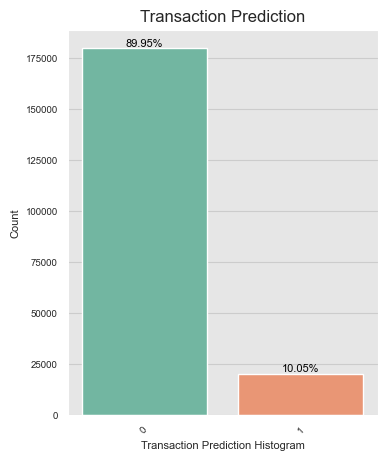

In [33]:
# target variable analysis
plt.figure(figsize=(4, 5))
sns.countplot(x="target", data=data, palette='Set2', ax=plt.gca())
# data[target].value_counts().plot(kind='bar', title='Body Level')
# add percentages
for p in plt.gca().patches:
    plt.gca().text(p.get_x() + p.get_width()/2., p.get_height(), '{:1.2f}%'.format(100*p.get_height()/len(data)),
                   fontsize=8, color='black', ha='center', va='bottom')
plt.xticks(rotation=45, fontsize=7)
plt.yticks(fontsize=7)
plt.xlabel('Transaction Prediction Histogram', fontsize=8)
plt.ylabel('Count', fontsize=8)
plt.title('Transaction Prediction')
plt.axis('tight')
plt.savefig('../images/data_analysis/transaction_distribution.png',
            dpi=300, bbox_inches='tight')
plt.show()


In [34]:
X = data.drop(['ID_code', 'target'], axis=1)  
y = data['target']

In [35]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42,n_jobs=-1)
X, y = smote.fit_resample(X, y)
# shuffle the data
X, y = shuffle(X, y, random_state=42)

c:\Users\peter\miniconda3\Lib\site-packages\imblearn\over_sampling\_smote\base.py:363: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


In [36]:
print(X.shape)
print(y.shape)

(359804, 200)
(359804,)


In [37]:
print(type(X))
print(type(y))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


In [38]:
data = pd.concat([X, y], axis=1)
data.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,target
62251,7.838900,1.001700,10.647800,8.094300,10.986900,-17.888500,5.042500,10.430000,3.942600,6.874800,...,8.419100,2.665600,4.505100,15.241200,0.398900,5.457900,9.828200,19.691400,8.593000,0
286258,10.621722,-2.904331,12.394653,6.450953,9.743171,-4.214986,5.296131,15.883326,-2.783475,6.605245,...,6.318277,0.782469,5.004927,14.847183,2.010905,4.753948,8.642806,12.641193,13.177390,1
241202,12.186679,0.597600,8.650691,8.914755,12.601637,2.308213,5.948395,15.961488,-2.082307,7.280514,...,12.300148,1.060929,0.342157,14.372102,1.336577,4.482792,9.463385,16.265762,-2.258591,1
41282,11.462100,-5.323600,12.439200,10.031000,11.955700,-2.860300,6.724800,16.146400,-3.339200,5.556600,...,4.258600,0.135800,8.690700,20.497600,-0.102400,0.772700,8.227100,13.908200,0.863600,0
53404,9.972700,-5.667700,11.252300,8.050100,12.375100,5.120100,5.662900,24.244000,0.562000,8.059400,...,3.503000,4.591400,3.069000,22.924000,-1.669800,-0.193500,10.126700,9.598400,8.374200,0


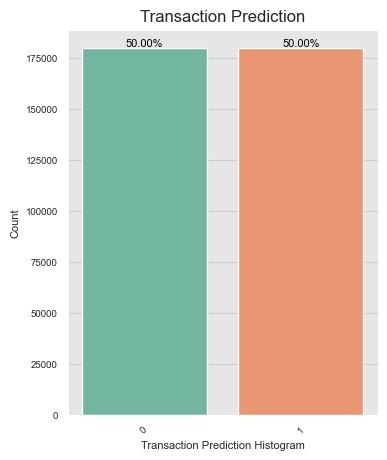

In [39]:
# target variable analysis
plt.figure(figsize=(4, 5))
sns.countplot(x="target", data=data, palette='Set2', ax=plt.gca())
# data[target].value_counts().plot(kind='bar', title='Body Level')
# add percentages
for p in plt.gca().patches:
    plt.gca().text(p.get_x() + p.get_width()/2., p.get_height(), '{:1.2f}%'.format(100*p.get_height()/len(data)),
                   fontsize=8, color='black', ha='center', va='bottom')
plt.xticks(rotation=45, fontsize=7)
plt.yticks(fontsize=7)
plt.xlabel('Transaction Prediction Histogram', fontsize=8)
plt.ylabel('Count', fontsize=8)
plt.title('Transaction Prediction')
plt.axis('tight')
plt.savefig('../images/data_analysis/transaction_distribution_after_SMOT.png',
            dpi=300, bbox_inches='tight')
plt.show()


In [40]:
# getting the min and max values of each feature
min_values = X.min()
max_values = X.max()
print("Min values of each feature: \n", min_values)
print("Max values of each feature: \n", max_values)

Min values of each feature: 
 var_0       0.4084
var_1     -15.0434
var_2       2.1171
var_3      -0.0402
var_4       5.0748
            ...   
var_195    -5.2610
var_196   -14.2096
var_197     5.9606
var_198     6.2993
var_199   -38.8528
Length: 200, dtype: float64
Max values of each feature: 
 var_0      20.3150
var_1      10.3768
var_2      19.3530
var_3      13.1883
var_4      16.6714
            ...   
var_195     4.2729
var_196    18.3215
var_197    12.0004
var_198    26.0791
var_199    28.5007
Length: 200, dtype: float64


In [41]:
X.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
62251,7.838900,1.001700,10.647800,8.094300,10.986900,-17.888500,5.042500,10.430000,3.942600,6.874800,...,0.873100,8.419100,2.665600,4.505100,15.241200,0.398900,5.457900,9.828200,19.691400,8.593000
286258,10.621722,-2.904331,12.394653,6.450953,9.743171,-4.214986,5.296131,15.883326,-2.783475,6.605245,...,1.552924,6.318277,0.782469,5.004927,14.847183,2.010905,4.753948,8.642806,12.641193,13.177390
241202,12.186679,0.597600,8.650691,8.914755,12.601637,2.308213,5.948395,15.961488,-2.082307,7.280514,...,6.227285,12.300148,1.060929,0.342157,14.372102,1.336577,4.482792,9.463385,16.265762,-2.258591
41282,11.462100,-5.323600,12.439200,10.031000,11.955700,-2.860300,6.724800,16.146400,-3.339200,5.556600,...,-0.091800,4.258600,0.135800,8.690700,20.497600,-0.102400,0.772700,8.227100,13.908200,0.863600
53404,9.972700,-5.667700,11.252300,8.050100,12.375100,5.120100,5.662900,24.244000,0.562000,8.059400,...,1.237600,3.503000,4.591400,3.069000,22.924000,-1.669800,-0.193500,10.126700,9.598400,8.374200


In [42]:
# getting the maen and std values of each feature
mean_values = X.mean(axis=0)
std_values = X.std(axis=0)
# print("Mean values of each feature: \n", mean_values)
# print("Std values of each feature: \n", std_values)

In [43]:
# features analysis
for i in range(0,200,100):
    print(f"Features [{i},{i+100}]")
    X.iloc[:,i:i+100].hist(
        figsize=(100, 100), bins=50, xlabelsize=25, ylabelsize=25,)
    plt.savefig(f'../images/data_analysis/numerical_[{i},{i+100}]_features_distribution.png',
                dpi=300, bbox_inches='tight')
    plt.show()    

Features [0,100]


Features [100,200]


It's noticed that all the features are normally distributed so we can use standardization to scale the data.

In [44]:
# apply this equation for each feature separately to standardize the data
X = standardize_features(X)

Mean values of each feature: 
 var_0     -2.117978e-16
var_1     -7.974263e-17
var_2      1.241165e-15
var_3      1.323119e-16
var_4     -5.278654e-16
               ...     
var_195    7.691865e-18
var_196   -8.215189e-18
var_197   -3.040607e-16
var_198    5.630169e-17
var_199   -2.300648e-17
Length: 200, dtype: float64
Std values of each feature: 
 var_0      1.0
var_1      1.0
var_2      1.0
var_3      1.0
var_4      1.0
          ... 
var_195    1.0
var_196    1.0
var_197    1.0
var_198    1.0
var_199    1.0
Length: 200, dtype: float64


## Multivariate Analysis

Features [0,50]


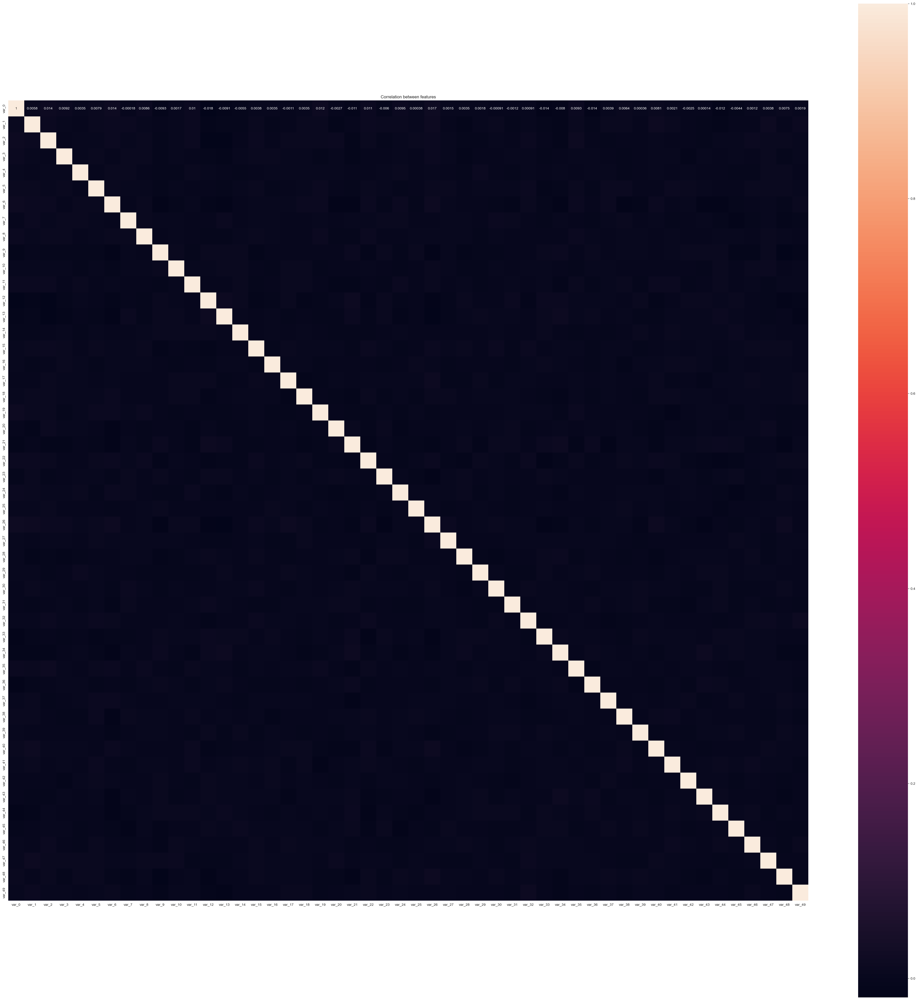

Features [50,100]


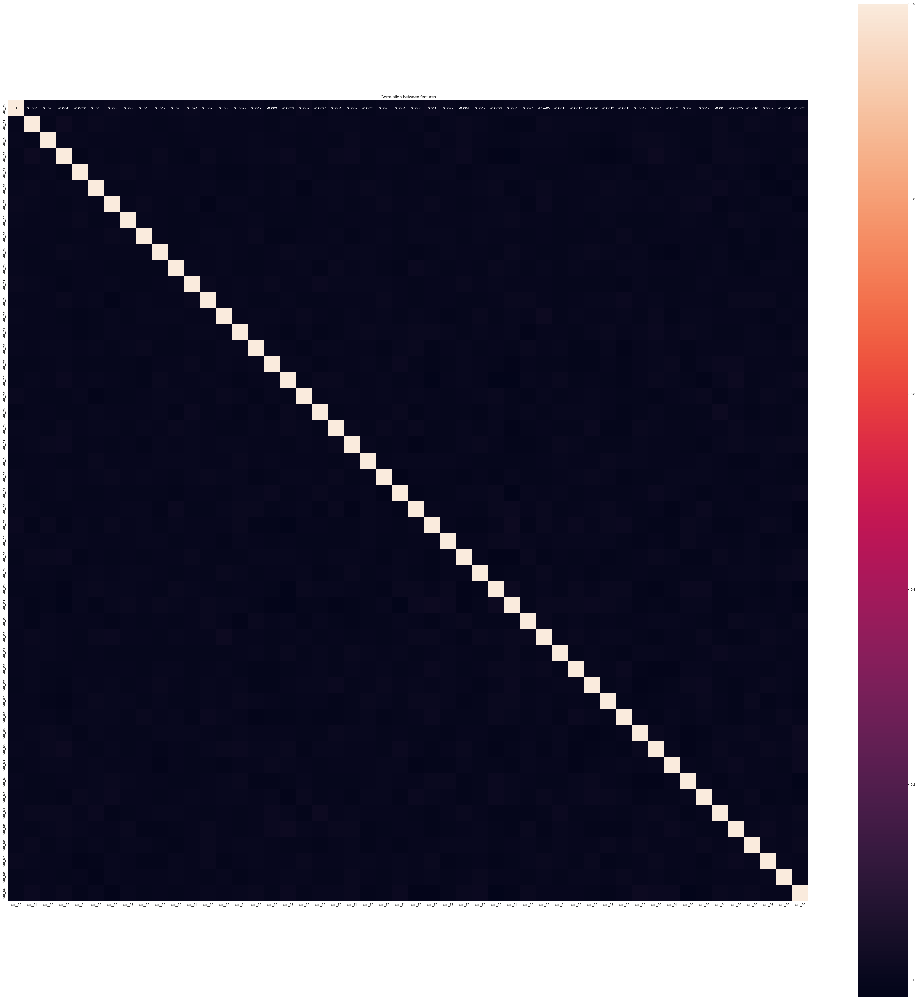

Features [100,150]


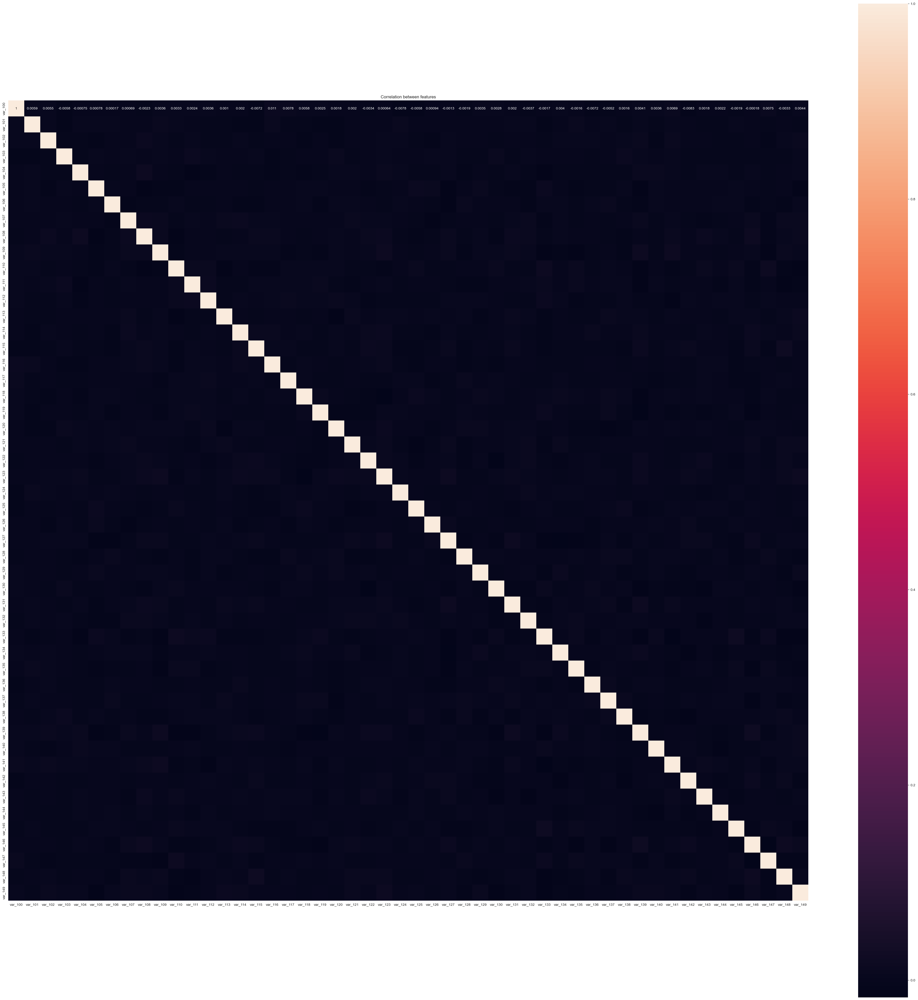

Features [150,200]


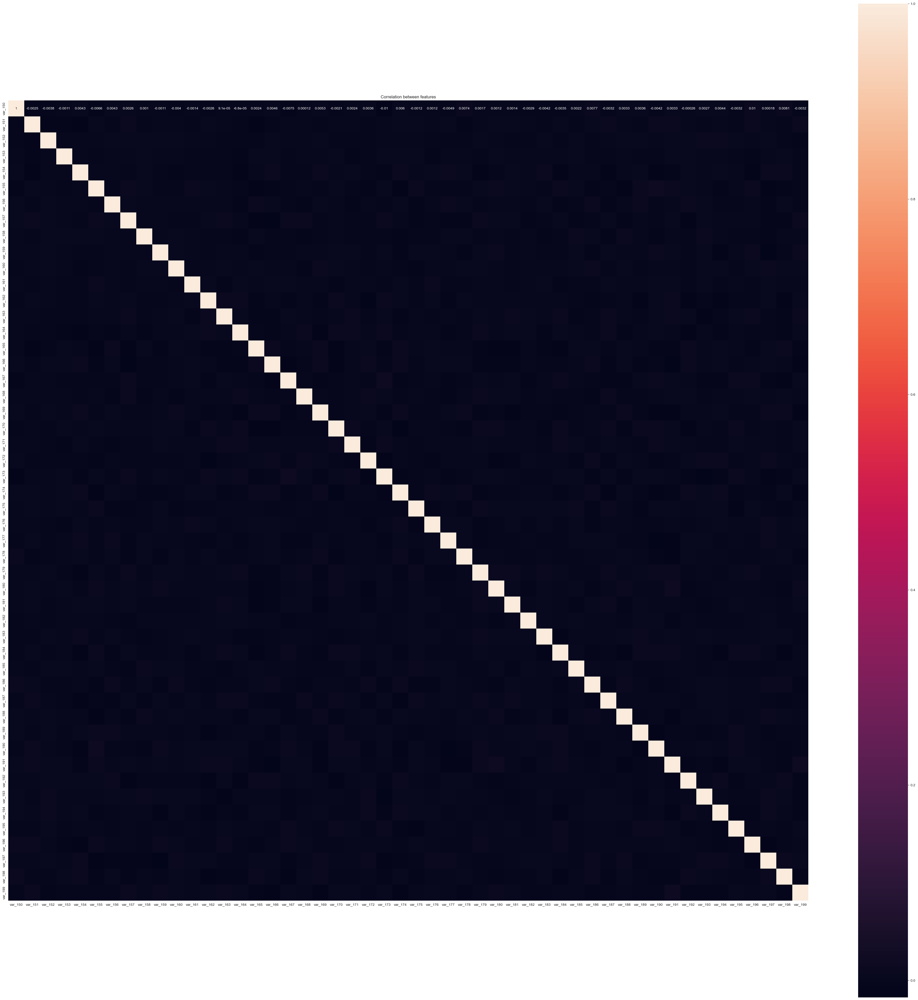

In [45]:
# correlation matrix
for i in range(0,200,50):
    print(f"Features [{i},{i+50}]")
    corr = X.iloc[:,i:i+50].corr()
    plt.figure(figsize=(50, 50))
    sns.heatmap(corr, vmax=1, square=True, annot=True,)
    plt.title('Correlation between features')
    plt.savefig(f'../images/data_analysis/correlation_matrix_[{i},{i+50}].png',
                dpi=300, bbox_inches='tight')
    plt.show()


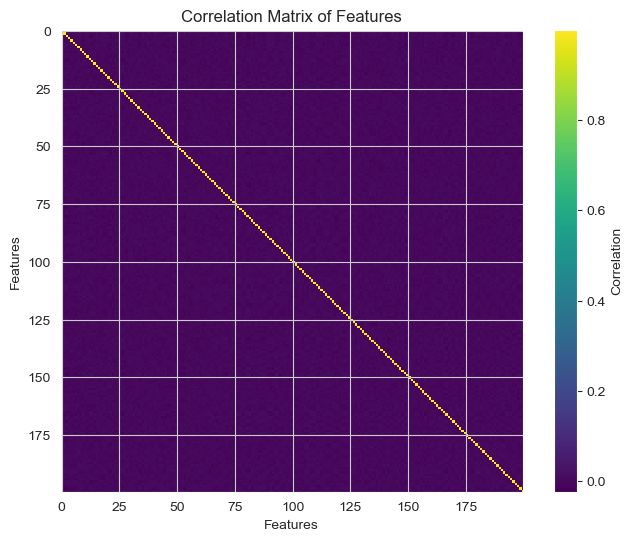

In [46]:
# cov matrix of all features
cov_matrix = EmpiricalCovariance().fit(X).covariance_

plt.figure(figsize=(8, 6))
plt.imshow(cov_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Correlation Matrix of Features')
plt.xlabel('Features')
plt.ylabel('Features')
plt.savefig(f'../images/data_analysis/correlation_matrix_of_all_features.png',
                dpi=300, bbox_inches='tight')
plt.show()

In [47]:
# variance threshold is the mean of the variance of all features
feature_variance = X.var()
print("Feature Variance: \n", feature_variance)
# max variance
mean_variance = feature_variance.mean()
print("mean Variance: ", mean_variance)
# scale your features to have zero mean and unit variance
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# You can also use variance thresholding to remove low-variance features
selector = VarianceThreshold(threshold=np.round(mean_variance))
X_selected = selector.fit_transform(X_scaled)

Feature Variance: 
 var_0      1.0
var_1      1.0
var_2      1.0
var_3      1.0
var_4      1.0
          ... 
var_195    1.0
var_196    1.0
var_197    1.0
var_198    1.0
var_199    1.0
Length: 200, dtype: float64
mean Variance:  0.9999999999999949


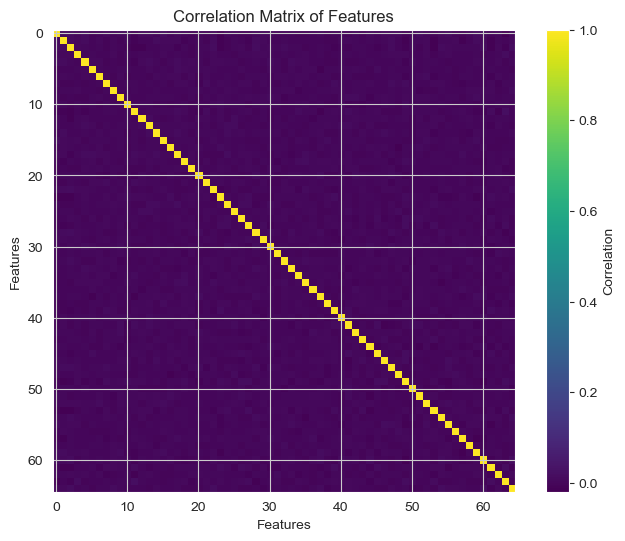

In [48]:

# Compute the correlation matrix
cov_matrix = EmpiricalCovariance().fit(X_selected).covariance_

# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
plt.imshow(cov_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Correlation Matrix of Features')
plt.xlabel('Features')
plt.ylabel('Features')
plt.savefig(f'../images/data_analysis/correlation_matrix_of_selected_features.png',
                dpi=300, bbox_inches='tight')
plt.show()


In [49]:
print("The shape of the selected features is: ", X_selected.shape)

The shape of the selected features is:  (359804, 65)


In [50]:
# Check the shape of the transformed data
print("Original shape:", X.shape)

Original shape: (359804, 200)


## PCA

Transformed shape: (359804, 10)


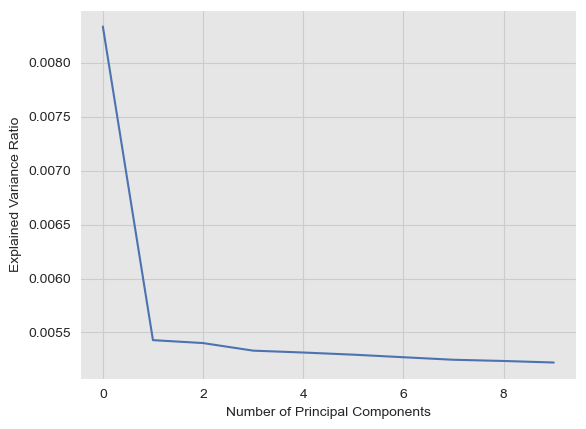

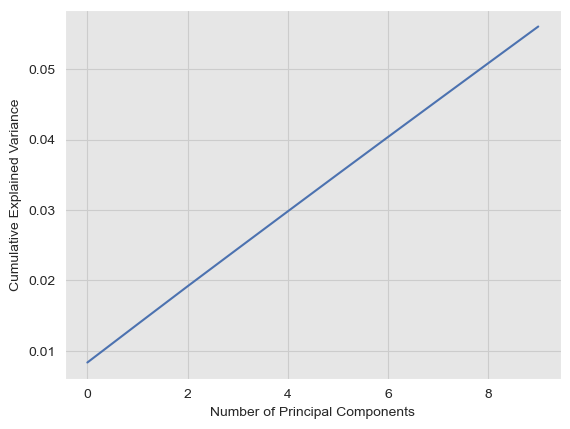

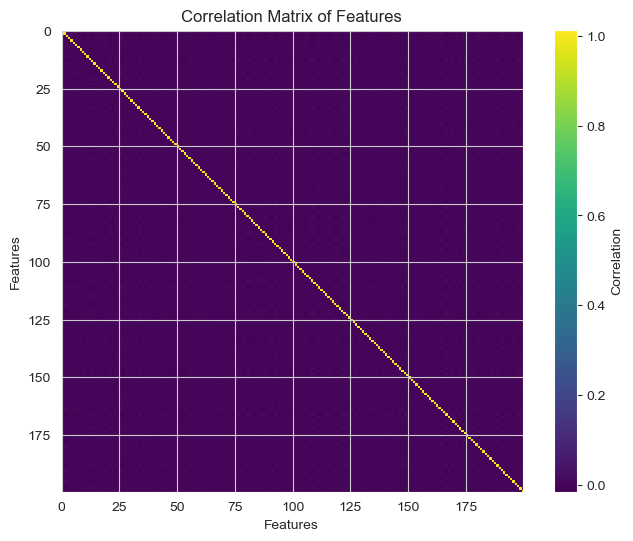

Transformed shape: (359804, 20)


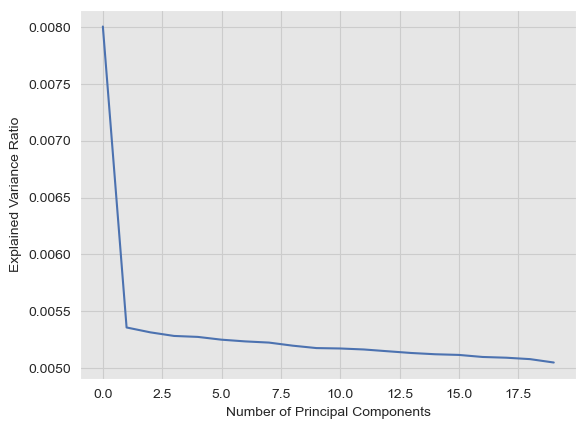

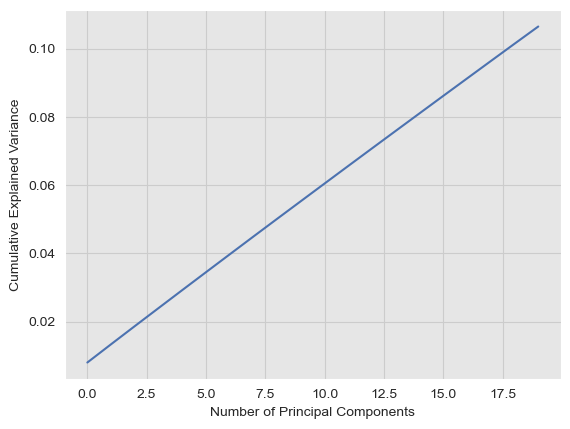

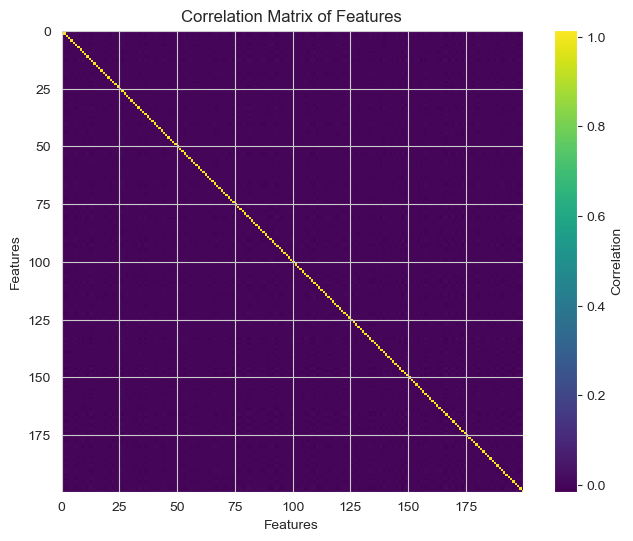

Transformed shape: (359804, 30)


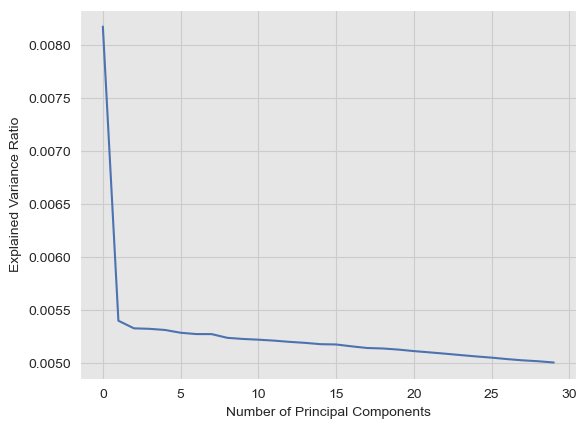

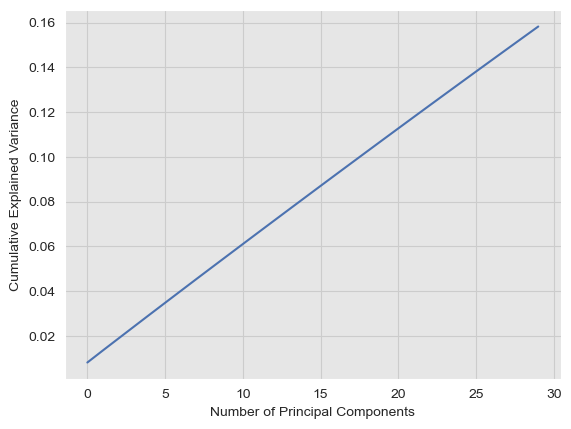

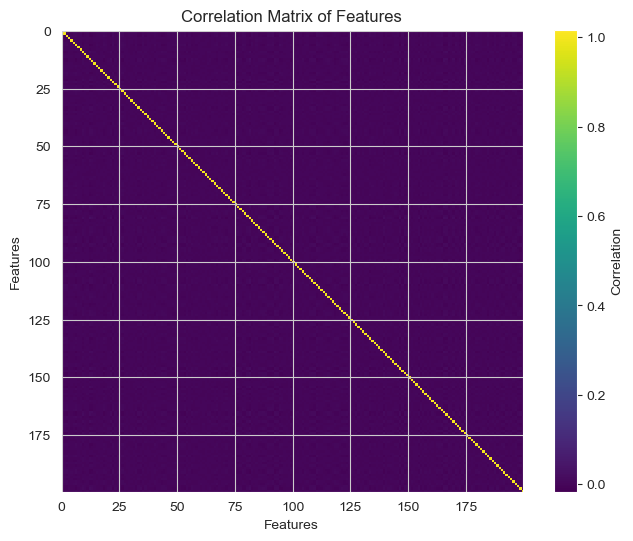

Transformed shape: (359804, 40)


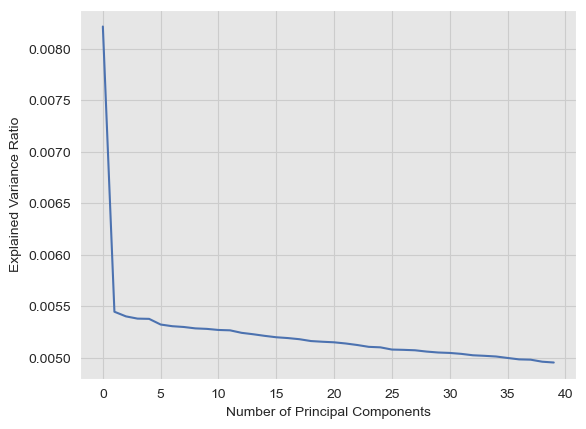

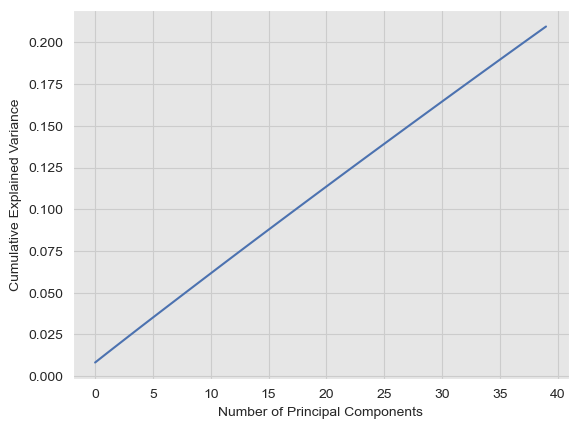

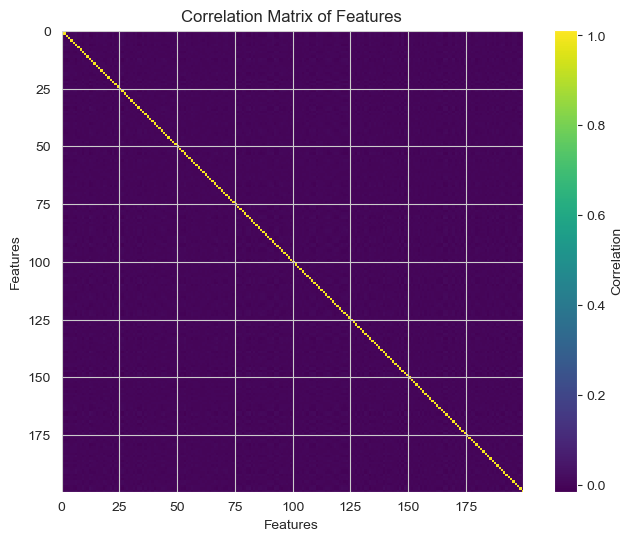

Transformed shape: (359804, 50)


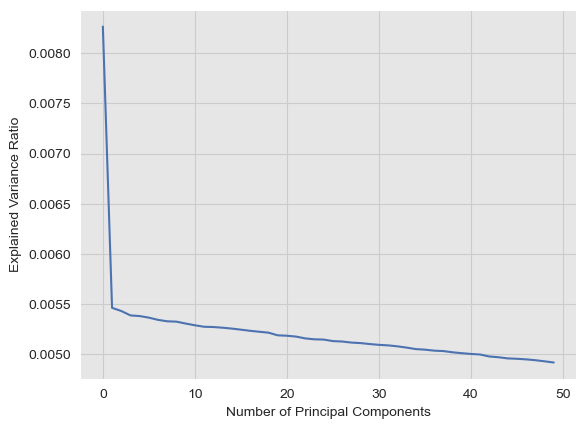

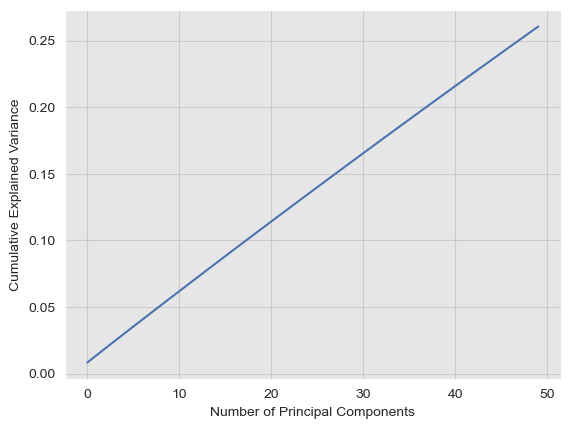

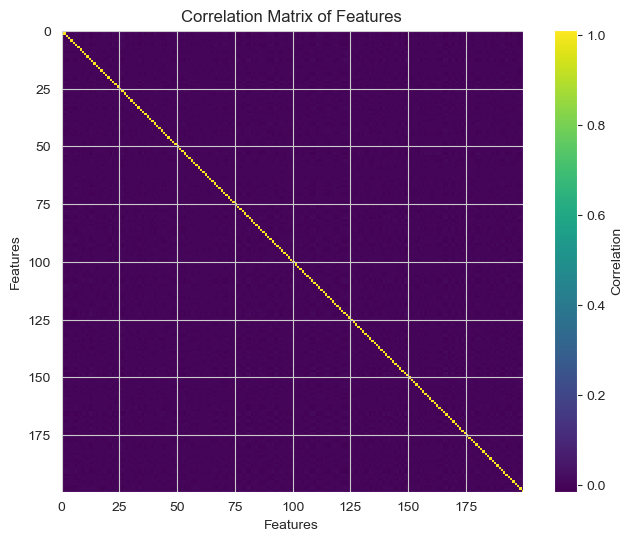

Transformed shape: (359804, 60)


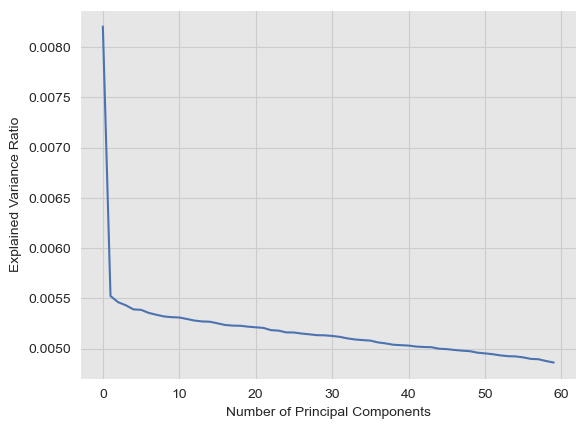

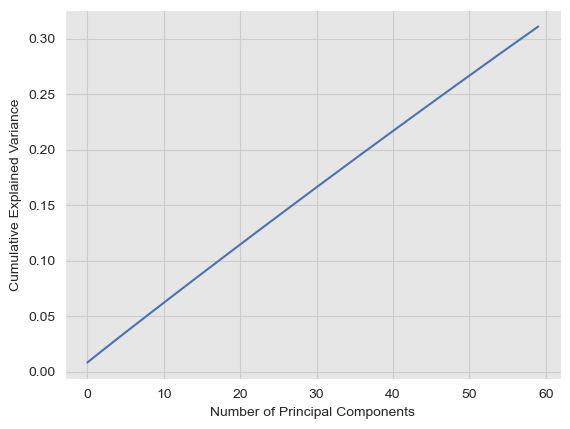

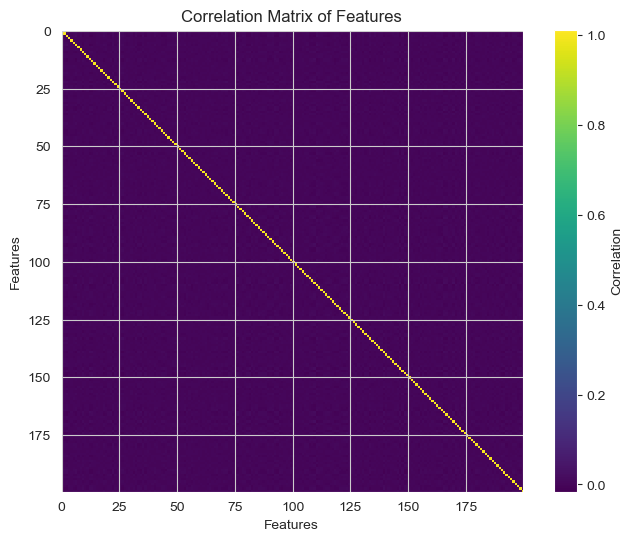

Transformed shape: (359804, 70)


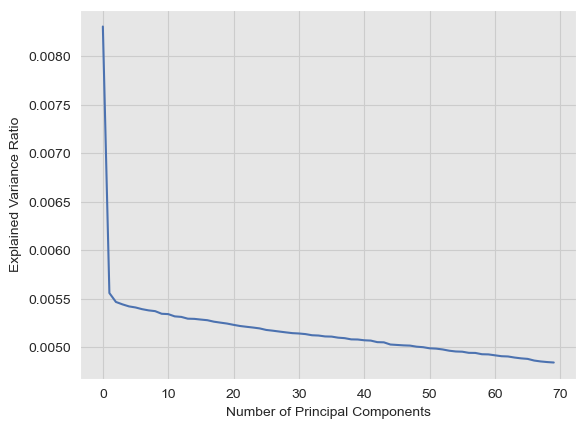

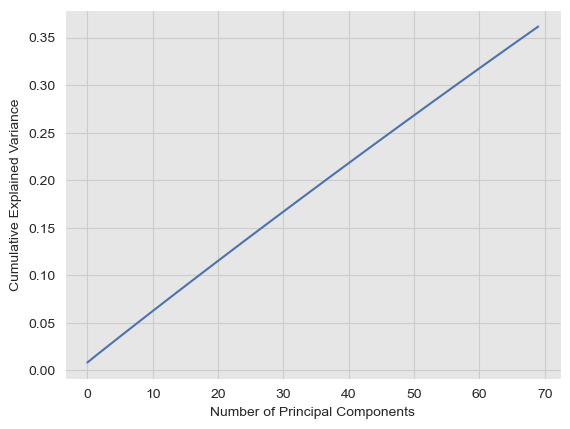

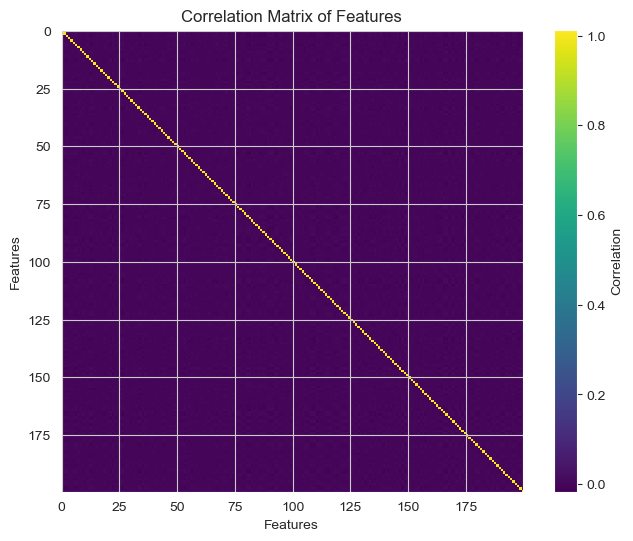

Transformed shape: (359804, 80)


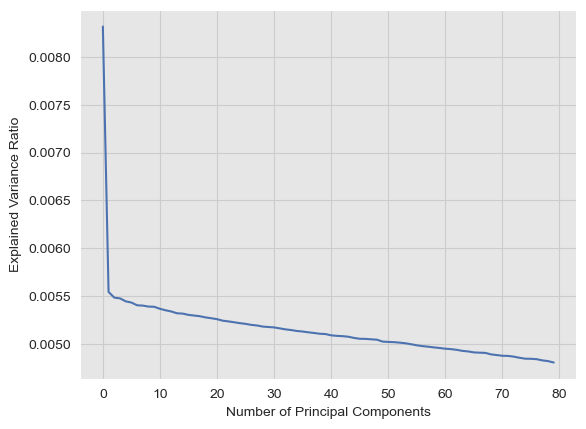

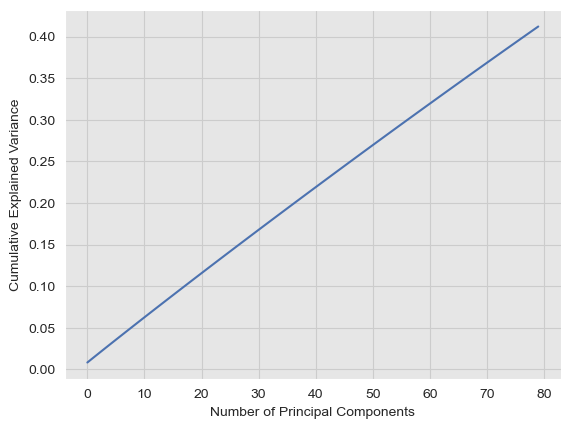

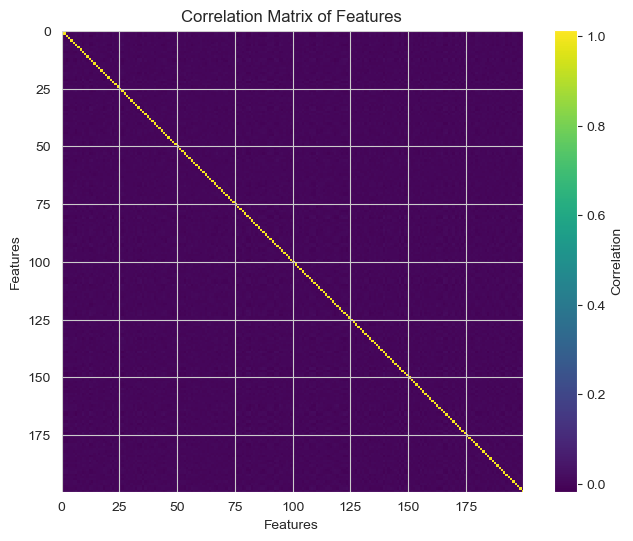

Transformed shape: (359804, 90)


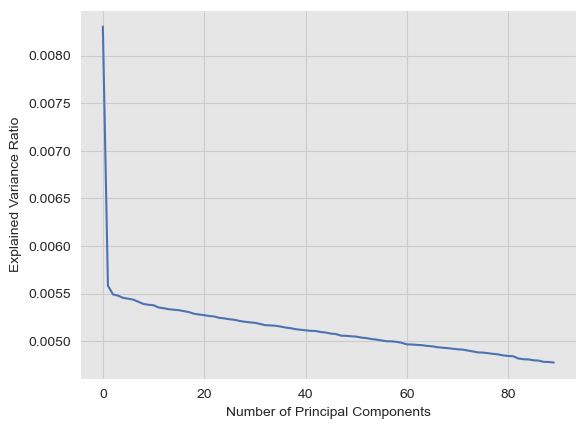

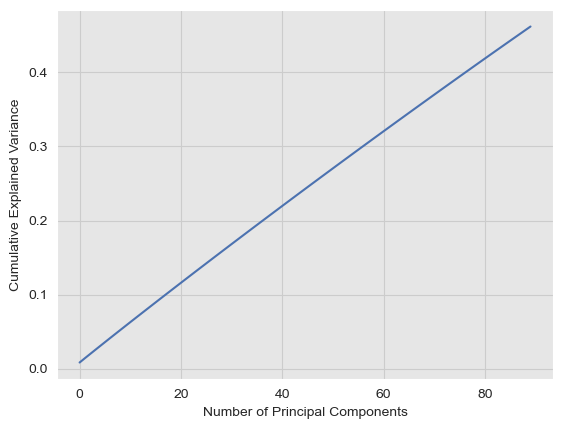

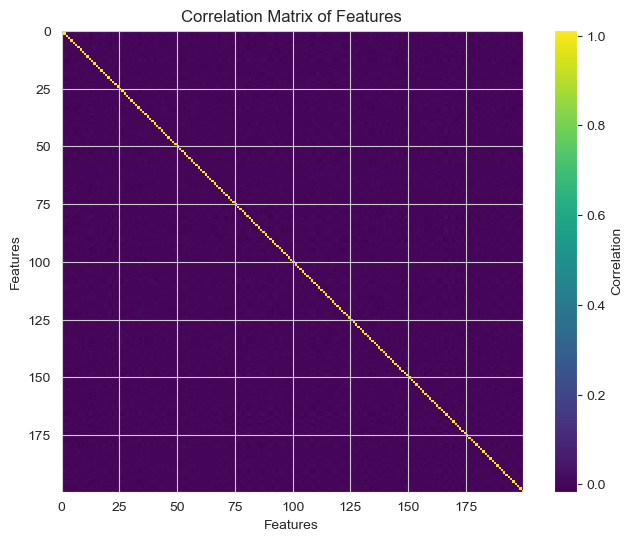

In [51]:
for i in range(10,100,10):
    # Instantiate PCA and specify the number of components
    pca = PCA(n_components=i)

    # Fit PCA to the data
    pca.fit(X)

    # Transform the data into the new feature space
    X_pca = pca.transform(X)

    print("Transformed shape:", X_pca.shape)
    # Plot the explained variance ratio
    plt.plot(pca.explained_variance_ratio_)
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Explained Variance Ratio')
    # save
    plt.savefig(f'../images/data_analysis/pca_n_components={i}_variance_ratio.png')
    plt.show()
    
    # Plot the cumulative explained variance ratio
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance')
    # save
    plt.savefig(f'../images/data_analysis/pca_n_components={i}_cumulative_variance_ratio.png')
    plt.show()
    
    # plot the correlation matrix of the transformed data
    cov_matrix = pca.get_covariance()
    plt.figure(figsize=(8, 6))
    plt.imshow(cov_matrix, cmap='viridis', interpolation='nearest')
    plt.colorbar(label='Correlation')
    plt.title('Correlation Matrix of Features')
    plt.xlabel('Features')
    plt.ylabel('Features')
    plt.savefig(f'../images/data_analysis/pca_n_components={i}_correlation_matrix.png',
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # create dataframe with the output of the PCA with the columns named
    X_pca_df = pd.DataFrame(X_pca, columns=pca.get_feature_names_out())
    # add the target column
    X_pca_df['target'] = y
    # save the dataset after applying PCA
    X_pca_df.to_csv(f'../data/train_pca_{i}.csv', index=False)